# DRT Demand Density — Bavaria 10% vs Lyon 10%

Compares DRT request structure between Bavaria (Kelheim 30km) and Lyon (IDF, exclusion zone applied) both at 10% sample rate.  
Investigates why Lyon generates far more ExMAS pairs than Bavaria despite similar sample rate.

**Sections**
1. Setup & load
2. Summary statistics
3. Temporal density
4. Spatial clustering
5. Pair feasibility estimate (Euclidean proxy)
6. Trip direction alignment
7. Statistical plots (9-panel)
8. Map — O→D linestrings (budget)
9. Map — O→D linestrings (base mode)
10. Map — pure density
11. Map — detour time tolerance

In [14]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
from matplotlib.collections import LineCollection
from scipy.spatial import cKDTree
from shapely.geometry import LineString
import contextily as ctx
%matplotlib inline

BASE    = r"C:\Users\VWAUCCY\dev\msf\projects\Dissertation\outputs"
OUT_DIR = os.path.join(BASE, "demand-comparison-10pct")
os.makedirs(OUT_DIR, exist_ok=True)

BAV_CSV = os.path.join(BASE, "10pct-coverage-K10", "drt_demand",
                       "bavaria-30km-100pct-exmas.drt_requests.csv")
LYO_CSV = os.path.join(BASE, "lyon-eqasim-demand-extraction-10pct", "drt_demand",
                       "lyon-drt-10pct-eqasim-exmas.drt_requests.csv")

SEARCH_HORIZON = 3600.0
MAX_DETOUR     = 1.5
COLOR_BAV      = "steelblue"
COLOR_LYO      = "darkorange"

## 1. Load data

In [15]:
bav = pd.read_csv(BAV_CSV)
lyo = pd.read_csv(LYO_CSV)

print(f"Bavaria 10%:  {len(bav):,} requests")
print(f"Lyon 10%:     {len(lyo):,} requests")
print(f"\nColumns: {list(bav.columns)}")

Bavaria 10%:  19,536 requests
Lyon 10%:     7,644 requests

Columns: ['index', 'personId', 'groupId', 'tripIndex', 'isCommute', 'budget', 'requestTime', 'originLinkId', 'destinationLinkId', 'originX', 'originY', 'destinationX', 'destinationY', 'originActivityType', 'destinationActivityType', 'directTravelTime', 'directDistance', 'earliestDeparture', 'latestArrival', 'maxTravelTime', 'maxPositiveDelay', 'maxNegativeDelay', 'baseModeScore', 'baseMode', 'carTravelTime', 'ptTravelTime', 'ptAccessibility', 'maxCostPerKm']


## 2. Summary statistics

In [16]:
def summary(label, df):
    d    = df["directDistance"] / 1000
    b    = df["budget"]
    t    = df["requestTime"]
    mtt  = df["maxTravelTime"] / 60        # seconds → minutes
    dtt  = df["directTravelTime"] / 60
    det  = mtt - dtt
    pos  = (b > 0).mean() * 100
    bins = np.arange(0, 86401, 1800)
    counts, _ = np.histogram(t, bins=bins)
    peak_h = bins[np.argmax(counts)] / 3600
    modes  = df["baseMode"].value_counts(normalize=True) * 100
    rows = [
        ("n requests",          f"{len(df):,}"),
        ("dist p25/med/p75",    f"{d.quantile(.25):.1f} / {d.median():.1f} / {d.quantile(.75):.1f} km"),
        ("dist mean",           f"{d.mean():.1f} km"),
        ("budget p25/med/p75",  f"{b.quantile(.25):.2f} / {b.median():.2f} / {b.quantile(.75):.2f}"),
        ("budget >0",           f"{pos:.0f}%"),
        ("detour time p25/med/p75",  f"{(mtt-dtt).quantile(.25):.0f} / {(mtt-dtt).median():.0f} / {(mtt-dtt).quantile(.75):.0f} min  [=mTT−directTT]"),
        ("departure peak",      f"{counts.max():,} reqs/30min @ {peak_h:.1f}h"),
        ("base mode",           "  ".join(f"{m}={v:.0f}%" for m, v in modes.items())),
    ]
    print(f"\n{'─'*50}")
    print(f"  {label}")
    print(f"{'─'*50}")
    for k, v in rows:
        print(f"  {k:<28s} {v}")

summary("Bavaria 10%", bav)
summary("Lyon 10%",    lyo)



──────────────────────────────────────────────────
  Bavaria 10%
──────────────────────────────────────────────────
  n requests                   19,536
  dist p25/med/p75             3.2 / 7.0 / 13.0 km
  dist mean                    9.8 km
  budget p25/med/p75           1.77 / 2.39 / 2.96
  budget >0                    100%
  detour time p25/med/p75      4 / 7 / 11 min  [=mTT−directTT]
  departure peak               1,699 reqs/30min @ 7.5h
  base mode                    pt=39%  bike=38%  car=21%  walk=1%

──────────────────────────────────────────────────
  Lyon 10%
──────────────────────────────────────────────────
  n requests                   7,644
  dist p25/med/p75             4.0 / 8.2 / 17.3 km
  dist mean                    11.7 km
  budget p25/med/p75           0.37 / 0.92 / 1.91
  budget >0                    100%
  detour time p25/med/p75      5 / 8 / 13 min  [=mTT−directTT]
  departure peak               920 reqs/30min @ 7.5h
  base mode                    car=77%  bik

## 3. Temporal density — candidates per request

In [17]:
def temporal_candidates(df, label):
    t = np.sort(df["requestTime"].values)
    lo = hi = 0
    cands = []
    for ti in t:
        while t[lo] < ti - SEARCH_HORIZON: lo += 1
        while hi < len(t) and t[hi] <= ti + SEARCH_HORIZON: hi += 1
        cands.append(hi - lo - 1)
    c = np.array(cands)
    print(f"  {label:<14s}  mean={c.mean():.0f}  median={np.median(c):.0f}  "
          f"p90={np.percentile(c,90):.0f}  max={c.max()}")
    return c

print(f"Temporal candidates per request  (|Δt| ≤ {SEARCH_HORIZON:.0f}s)")
cands_bav = temporal_candidates(bav, "Bavaria 10%")
cands_lyo = temporal_candidates(lyo, "Lyon 10%")
print(f"\nRatio Lyon/Bavaria: {cands_lyo.mean()/cands_bav.mean():.1f}×")

Temporal candidates per request  (|Δt| ≤ 3600s)
  Bavaria 10%     mean=3078  median=2994  p90=5247  max=5489
  Lyon 10%        mean=1464  median=1437  p90=2413  max=2465

Ratio Lyon/Bavaria: 0.5×


## 4. Spatial clustering of origins

In [18]:
def nn_clustering(df, label):
    pts  = df[["originX", "originY"]].values
    tree = cKDTree(pts)
    nn   = tree.query(pts, k=2)[0][:, 1] / 1000
    print(f"  {label:<14s}  mean={nn.mean():.2f}km  median={np.median(nn):.2f}km  "
          f"p90={np.percentile(nn,90):.2f}km")
    return nn

print("Nearest-neighbour origin distance")
nn_bav = nn_clustering(bav, "Bavaria 10%")
nn_lyo = nn_clustering(lyo, "Lyon 10%")

Nearest-neighbour origin distance
  Bavaria 10%     mean=0.03km  median=0.00km  p90=0.10km
  Lyon 10%        mean=0.04km  median=0.00km  p90=0.13km


## 5. Pair feasibility estimate (Euclidean proxy)

In [19]:
def pair_density(df, label, n_sample=1_000_000, seed=42):
    rng    = np.random.default_rng(seed)
    n      = len(df)
    ox, oy = df["originX"].values, df["originY"].values
    dx, dy = df["destinationX"].values, df["destinationY"].values
    t      = df["requestTime"].values
    direct = np.hypot(ox - dx, oy - dy)

    a = rng.integers(0, n, n_sample)
    b = rng.integers(0, n, n_sample)
    keep = a != b; a, b = a[keep], b[keep]

    temporal = np.abs(t[a] - t[b]) <= SEARCH_HORIZON
    a, b = a[temporal], b[temporal]

    e = lambda x1,y1,x2,y2: np.hypot(x1-x2, y1-y2)
    fifo = e(ox[a],oy[a],ox[b],oy[b]) + e(ox[b],oy[b],dx[a],dy[a]) + e(dx[a],dy[a],dx[b],dy[b])
    lifo = e(ox[a],oy[a],ox[b],oy[b]) + e(ox[b],oy[b],dx[b],dy[b]) + e(dx[b],dy[b],dx[a],dy[a])
    total_d = direct[a] + direct[b]

    feasible = (fifo <= MAX_DETOUR * total_d) | (lifo <= MAX_DETOUR * total_d)
    p_t = temporal.mean()
    p_f = feasible.mean() if len(feasible) > 0 else 0.0
    est = p_t * p_f * (n - 1)
    print(f"  {label:<14s}  temporal={p_t*100:.1f}%  feasible|temporal={p_f*100:.1f}%  "
          f"→ est {est:.0f} pairs/req  (~{int(est*n/2):,} total)")
    return p_t, p_f, est

print(f"Estimated pair feasibility (Euclidean proxy, 1M sampled pairs, maxDetour={MAX_DETOUR})")
bav_pt, bav_pf, bav_est = pair_density(bav, "Bavaria 10%")
lyo_pt, lyo_pf, lyo_est = pair_density(lyo, "Lyon 10%")
print(f"\nEuclidean ratio Lyon/Bavaria: {lyo_est/bav_est:.1f}×")
print("Note: actual road-network ratio is higher (suburban network density vs rural funnel)")

Estimated pair feasibility (Euclidean proxy, 1M sampled pairs, maxDetour=1.5)
  Bavaria 10%     temporal=15.8%  feasible|temporal=18.2%  → est 562 pairs/req  (~5,491,811 total)
  Lyon 10%        temporal=19.2%  feasible|temporal=22.5%  → est 330 pairs/req  (~1,259,933 total)

Euclidean ratio Lyon/Bavaria: 0.6×
Note: actual road-network ratio is higher (suburban network density vs rural funnel)


## 6. Trip direction alignment

In [20]:
def direction_alignment(df, label, n_sample=500_000, seed=42):
    rng    = np.random.default_rng(seed)
    n      = len(df)
    ox, oy = df["originX"].values, df["originY"].values
    dx, dy = df["destinationX"].values, df["destinationY"].values
    t      = df["requestTime"].values
    vx, vy = dx - ox, dy - oy
    norm   = np.hypot(vx, vy)
    valid  = norm > 0
    vx[valid] /= norm[valid]; vy[valid] /= norm[valid]

    a = rng.integers(0, n, n_sample); b = rng.integers(0, n, n_sample)
    m = (a != b) & valid[a] & valid[b]; a, b = a[m], b[m]
    temporal = np.abs(t[a] - t[b]) <= SEARCH_HORIZON; a, b = a[temporal], b[temporal]
    cos_t = vx[a]*vx[b] + vy[a]*vy[b]
    print(f"  {label:<14s}  cos θ > 0.7: {(cos_t>0.7).mean()*100:.1f}%  "
          f"cos θ > 0: {(cos_t>0).mean()*100:.1f}%  mean cos={cos_t.mean():.3f}")

print("Trip direction alignment (temporal pairs)")
print("  Higher cos θ → trips run in same direction → better FIFO feasibility")
direction_alignment(bav, "Bavaria 10%")
direction_alignment(lyo, "Lyon 10%")

Trip direction alignment (temporal pairs)
  Higher cos θ → trips run in same direction → better FIFO feasibility
  Bavaria 10%     cos θ > 0.7: 25.6%  cos θ > 0: 50.4%  mean cos=0.005
  Lyon 10%        cos θ > 0.7: 27.4%  cos θ > 0: 51.9%  mean cos=0.030


## 7. Statistical plots

c:\Users\VWAUCCY\dev\msf\projects\Dissertation\ExmasCommuters\.venv\Lib\site-packages\matplotlib\axes\_base.py:3070: RuntimeWarning: overflow encountered in scalar add
  x0, x1 = inverse_trans.transform([x0t - delta, x1t + delta])


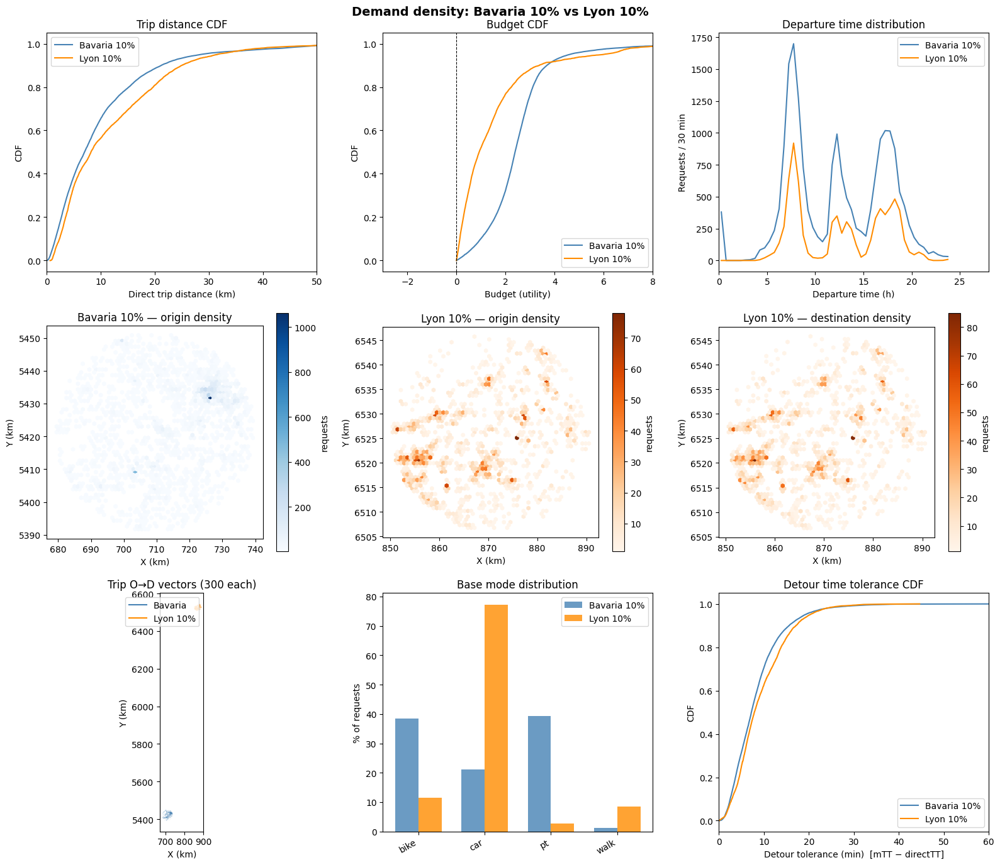

Saved: C:\Users\VWAUCCY\dev\msf\projects\Dissertation\outputs\demand-comparison-10pct\demand_density_bavaria_vs_lyon_10pct.png


In [21]:
datasets = [("Bavaria 10%", bav, COLOR_BAV), ("Lyon 10%", lyo, COLOR_LYO)]

fig, axes = plt.subplots(3, 3, figsize=(16, 14))
fig.suptitle("Demand density: Bavaria 10% vs Lyon 10%", fontsize=14, fontweight="bold")

# Trip distance CDF
ax = axes[0, 0]
for label, df, col in datasets:
    d = np.sort(df["directDistance"].values / 1000)
    ax.plot(d, np.linspace(0, 1, len(d)), label=label, color=col)
ax.set_xlabel("Direct trip distance (km)"); ax.set_ylabel("CDF")
ax.set_xlim(0, 50); ax.set_title("Trip distance CDF"); ax.legend()

# Budget CDF
ax = axes[0, 1]
for label, df, col in datasets:
    b = np.sort(df["budget"].values)
    ax.plot(b, np.linspace(0, 1, len(b)), label=label, color=col)
ax.axvline(0, color="black", lw=0.8, ls="--")
ax.set_xlim(-3, 8); ax.set_xlabel("Budget (utility)"); ax.set_ylabel("CDF")
ax.set_title("Budget CDF"); ax.legend()

# Departure time
ax = axes[0, 2]
bins_t = np.arange(0, 86401, 1800)
mid_h  = (bins_t[:-1] + bins_t[1:]) / 2 / 3600
for label, df, col in datasets:
    counts, _ = np.histogram(df["requestTime"], bins=bins_t)
    ax.plot(mid_h, counts, label=label, color=col)
ax.set_xlabel("Departure time (h)"); ax.set_ylabel("Requests / 30 min")
ax.set_title("Departure time distribution"); ax.legend(); ax.set_xlim(0, 28)

# Origin density — Bavaria
ax = axes[1, 0]
h = ax.hexbin(bav["originX"]/1000, bav["originY"]/1000, gridsize=60, cmap="Blues", mincnt=1)
plt.colorbar(h, ax=ax, label="requests")
ax.set_title("Bavaria 10% — origin density"); ax.set_xlabel("X (km)"); ax.set_ylabel("Y (km)")
ax.set_aspect("equal")

# Origin density — Lyon
ax = axes[1, 1]
h = ax.hexbin(lyo["originX"]/1000, lyo["originY"]/1000, gridsize=60, cmap="Oranges", mincnt=1)
plt.colorbar(h, ax=ax, label="requests")
ax.set_title("Lyon 10% — origin density"); ax.set_xlabel("X (km)"); ax.set_ylabel("Y (km)")
ax.set_aspect("equal")

# Destination density — Lyon
ax = axes[1, 2]
h = ax.hexbin(lyo["destinationX"]/1000, lyo["destinationY"]/1000, gridsize=60, cmap="Oranges", mincnt=1)
plt.colorbar(h, ax=ax, label="requests")
ax.set_title("Lyon 10% — destination density"); ax.set_xlabel("X (km)"); ax.set_ylabel("Y (km)")
ax.set_aspect("equal")

# O→D vectors
ax = axes[2, 0]
for label, df, col in datasets:
    s = df.sample(300, random_state=1)
    segs = [[(r.originX/1000, r.originY/1000), (r.destinationX/1000, r.destinationY/1000)]
            for r in s.itertuples()]
    lc = LineCollection(segs, colors=col, linewidths=0.5, alpha=0.25)
    ax.add_collection(lc)
ax.autoscale()
ax.set_title("Trip O→D vectors (300 each)"); ax.set_xlabel("X (km)"); ax.set_ylabel("Y (km)")
ax.set_aspect("equal")
ax.legend(handles=[Line2D([0],[0],color=COLOR_BAV,label="Bavaria"),
                   Line2D([0],[0],color=COLOR_LYO,label="Lyon 10%")])

# Base mode
ax = axes[2, 1]
all_modes = sorted(set(bav["baseMode"].unique()) | set(lyo["baseMode"].unique()))
x, w = np.arange(len(all_modes)), 0.35
bav_pct = [bav["baseMode"].value_counts(normalize=True).get(m,0)*100 for m in all_modes]
lyo_pct = [lyo["baseMode"].value_counts(normalize=True).get(m,0)*100 for m in all_modes]
ax.bar(x-w/2, bav_pct, w, label="Bavaria 10%", color=COLOR_BAV, alpha=0.8)
ax.bar(x+w/2, lyo_pct, w, label="Lyon 10%",    color=COLOR_LYO, alpha=0.8)
ax.set_xticks(x); ax.set_xticklabels(all_modes, rotation=30, ha="right")
ax.set_ylabel("% of requests"); ax.set_title("Base mode distribution"); ax.legend()

# Detour time CDF (maxTravelTime − directTravelTime)
ax = axes[2, 2]
for label, df, col in datasets:
    det = np.sort((df["maxTravelTime"] - df["directTravelTime"]).values / 60)
    ax.plot(det, np.linspace(0, 1, len(det)), label=label, color=col)
ax.set_xlabel("Detour tolerance (min)  [mTT − directTT]"); ax.set_ylabel("CDF")
ax.set_title("Detour time tolerance CDF"); ax.set_xlim(0, 60); ax.legend()

plt.tight_layout()
out = os.path.join(OUT_DIR, "demand_density_bavaria_vs_lyon_10pct.png")
plt.savefig(out, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {out}")

## 8–10. Map helpers

In [22]:
TARGET_CRS = "EPSG:3857"

MAP_DATASETS = [
    {"label": "Bavaria 10%", "df": bav, "crs": "EPSG:25832",
     "cmap": "Blues",   "color": COLOR_BAV},
    {"label": "Lyon 10%",    "df": lyo, "crs": "EPSG:2154",
     "cmap": "Oranges", "color": COLOR_LYO},
]

MODE_COLORS = {"car": "#e74c3c", "pt": "#3498db",
               "bike": "#2ecc71", "bicycle": "#2ecc71", "walk": "#9b59b6"}

def build_gdf(ds):
    df = ds["df"]
    ox = df["originX"].values;      oy = df["originY"].values
    dx = df["destinationX"].values; dy = df["destinationY"].values
    geoms = [LineString([(ox[i], oy[i]), (dx[i], dy[i])]) for i in range(len(df))]
    gdf = gpd.GeoDataFrame(df, geometry=geoms, crs=ds["crs"])
    return gdf.to_crs(TARGET_CRS)

print("Building GeoDataFrames...")
gdfs = {ds["label"]: (ds, build_gdf(ds)) for ds in MAP_DATASETS}
print("Done.")

def add_basemap(ax):
    try:
        ctx.add_basemap(ax, crs=TARGET_CRS, source=ctx.providers.CartoDB.DarkMatter,
                        zoom="auto", attribution=False)
    except Exception:
        try:
            ctx.add_basemap(ax, crs=TARGET_CRS, source=ctx.providers.OpenStreetMap.Mapnik,
                            zoom="auto", attribution=False)
        except Exception as e:
            print(f"  Basemap unavailable: {e}")

def draw_lines(ax, gdf, colors, alpha, lw=0.6):
    """Draw all O→D lines efficiently using LineCollection."""
    coords = np.array([line.coords for line in gdf.geometry])
    segs   = coords[:, :, :]     # shape (n, 2, 2)
    lc     = LineCollection(segs, colors=colors, linewidths=lw, alpha=alpha)
    ax.add_collection(lc)
    ax.autoscale()

def draw_arrows(ax, gdf, colors, alpha_line, n_arrows=600, seed=42):
    """Add arrowheads on a subsample for direction indication."""
    rng = np.random.default_rng(seed)
    idx = rng.choice(len(gdf), size=min(n_arrows, len(gdf)), replace=False)
    for i in idx:
        xs, ys = gdf.iloc[i].geometry.xy
        ddx, ddy = xs[1]-xs[0], ys[1]-ys[0]
        ax.annotate("",
            xy     =(xs[0]+0.85*ddx, ys[0]+0.85*ddy),
            xytext =(xs[0]+0.65*ddx, ys[0]+0.65*ddy),
            arrowprops=dict(arrowstyle="->", color=colors[i],
                            alpha=min(alpha_line*5, 0.7), lw=0.8),
        )

def add_colorbar(fig, ax, cmap, norm, label):
    sm = cm.ScalarMappable(cmap=cmap, norm=norm); sm.set_array([])
    cb = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cb.set_label(label, color="white")
    cb.ax.yaxis.set_tick_params(color="white")
    plt.setp(cb.ax.yaxis.get_ticklabels(), color="white")

Building GeoDataFrames...
Done.


## 8. Map — colored by budget

C:\Users\VWAUCCY\AppData\Local\Temp\ipykernel_6208\1700538507.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap  = cm.get_cmap(ds["cmap"])
C:\Users\VWAUCCY\AppData\Local\Temp\ipykernel_6208\1700538507.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap  = cm.get_cmap(ds["cmap"])


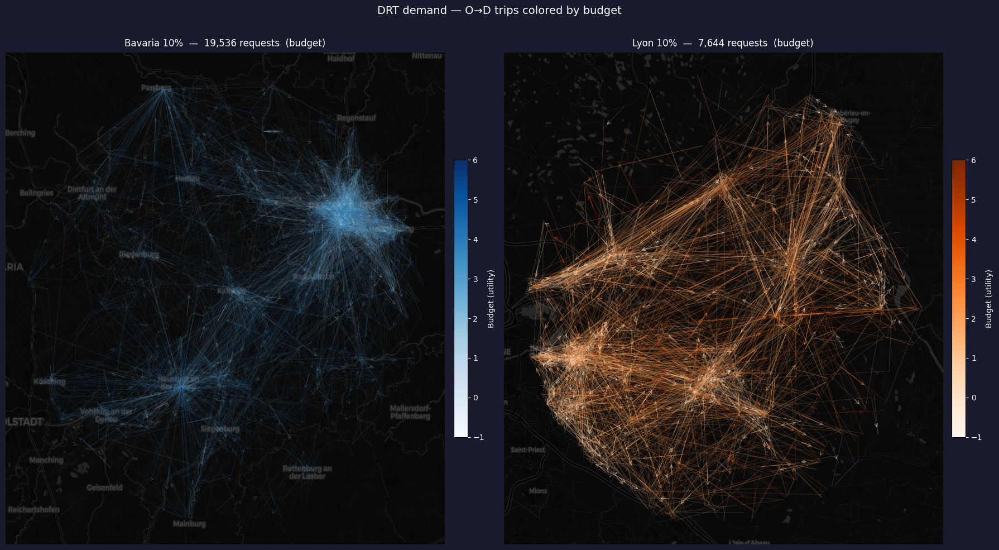

Saved: C:\Users\VWAUCCY\dev\msf\projects\Dissertation\outputs\demand-comparison-10pct\request_map_budget.png


In [23]:
fig, axes = plt.subplots(1, 2, figsize=(18, 10))
fig.patch.set_facecolor("#1a1a2e")

for ax, (label, (ds, gdf)) in zip(axes, gdfs.items()):
    vals  = gdf["budget"].clip(-1, 6).values
    norm  = mcolors.Normalize(vmin=-1, vmax=6)
    cmap  = cm.get_cmap(ds["cmap"])
    colors = [cmap(norm(v)) for v in vals]
    alpha  = max(0.04, min(0.20, 800 / len(gdf)))

    # sort low→high so high-budget lines draw on top
    order  = np.argsort(vals)
    sorted_gdf    = gdf.iloc[order]
    sorted_colors = [colors[i] for i in order]

    draw_lines(ax, sorted_gdf, sorted_colors, alpha)
    draw_arrows(ax, sorted_gdf, sorted_colors, alpha)
    add_basemap(ax)
    add_colorbar(fig, ax, cmap, norm, "Budget (utility)")
    ax.set_title(f"{label}  —  {len(gdf):,} requests  (budget)",
                 color="white", fontsize=12, pad=8)
    ax.set_axis_off()

fig.suptitle("DRT demand — O→D trips colored by budget", color="white", fontsize=14, y=0.98)
plt.tight_layout(rect=[0,0,1,0.97])
out = os.path.join(OUT_DIR, "request_map_budget.png")
plt.savefig(out, dpi=150, bbox_inches="tight", facecolor="#1a1a2e")
plt.show()
print(f"Saved: {out}")

## 9. Map — colored by base mode

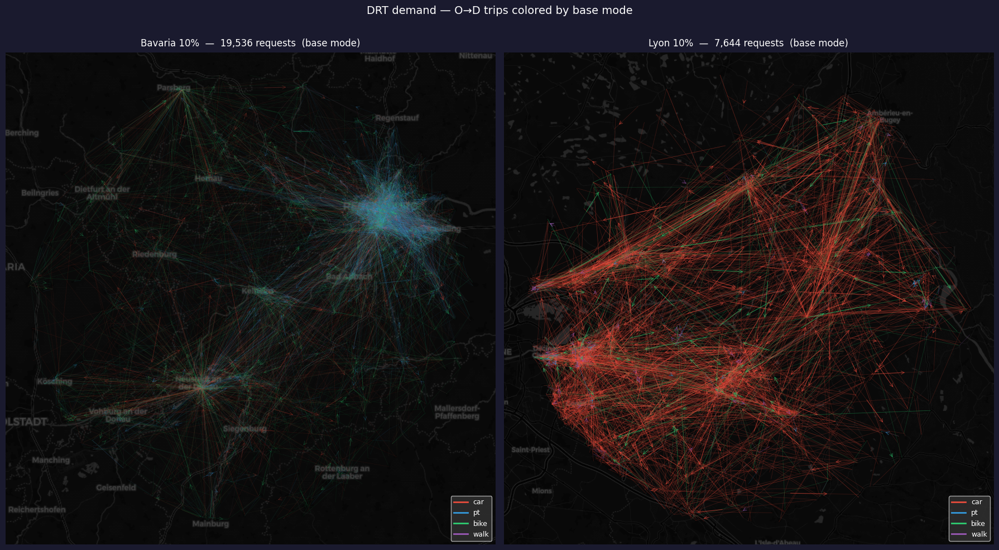

Saved: C:\Users\VWAUCCY\dev\msf\projects\Dissertation\outputs\demand-comparison-10pct\request_map_mode.png


In [24]:
fig, axes = plt.subplots(1, 2, figsize=(18, 10))
fig.patch.set_facecolor("#1a1a2e")

for ax, (label, (ds, gdf)) in zip(axes, gdfs.items()):
    colors = [MODE_COLORS.get(m, "#aaaaaa") for m in gdf["baseMode"].values]
    alpha  = max(0.04, min(0.20, 800 / len(gdf)))

    draw_lines(ax, gdf, colors, alpha)
    draw_arrows(ax, gdf, colors, alpha)
    add_basemap(ax)

    handles = [Line2D([0],[0], color=c, lw=2, label=m)
               for m, c in MODE_COLORS.items() if m in gdf["baseMode"].values]
    ax.legend(handles=handles, loc="lower right",
              facecolor="#333", labelcolor="white", fontsize=9)
    ax.set_title(f"{label}  —  {len(gdf):,} requests  (base mode)",
                 color="white", fontsize=12, pad=8)
    ax.set_axis_off()

fig.suptitle("DRT demand — O→D trips colored by base mode", color="white", fontsize=14, y=0.98)
plt.tight_layout(rect=[0,0,1,0.97])
out = os.path.join(OUT_DIR, "request_map_mode.png")
plt.savefig(out, dpi=150, bbox_inches="tight", facecolor="#1a1a2e")
plt.show()
print(f"Saved: {out}")

## 10. Map — density (all lines, no arrows)

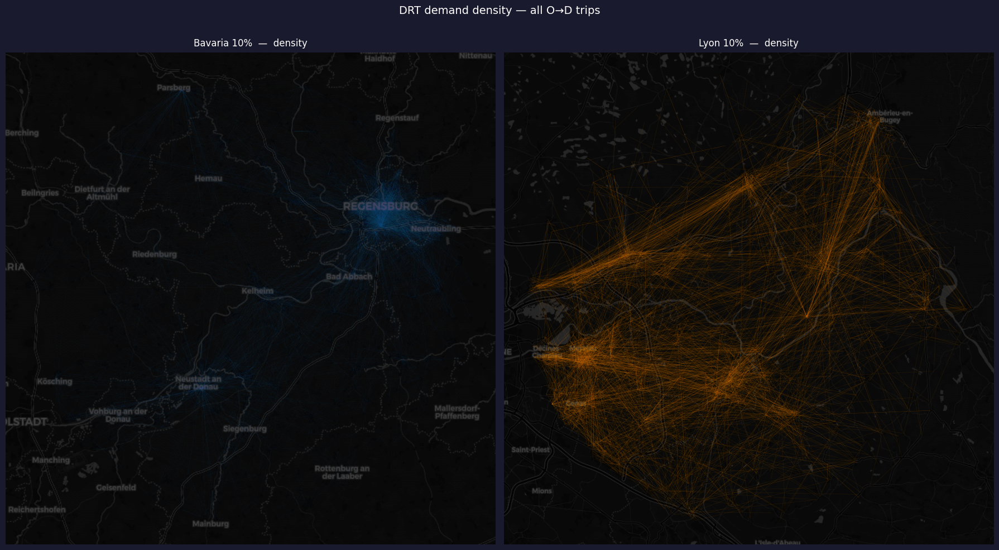

Saved: C:\Users\VWAUCCY\dev\msf\projects\Dissertation\outputs\demand-comparison-10pct\request_map_density.png


In [25]:
fig, axes = plt.subplots(1, 2, figsize=(18, 10))
fig.patch.set_facecolor("#1a1a2e")

for ax, (label, (ds, gdf)) in zip(axes, gdfs.items()):
    alpha = max(0.02, min(0.10, 400 / len(gdf)))
    draw_lines(ax, gdf, ds["color"], alpha, lw=0.5)
    add_basemap(ax)
    ax.set_title(f"{label}  —  density", color="white", fontsize=12, pad=8)
    ax.set_axis_off()

fig.suptitle("DRT demand density — all O→D trips", color="white", fontsize=14, y=0.98)
plt.tight_layout(rect=[0,0,1,0.97])
out = os.path.join(OUT_DIR, "request_map_density.png")
plt.savefig(out, dpi=150, bbox_inches="tight", facecolor="#1a1a2e")
plt.show()
print(f"Saved: {out}")

## 11. Map — colored by detour time tolerance

C:\Users\VWAUCCY\AppData\Local\Temp\ipykernel_6208\2987048626.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap  = cm.get_cmap(ds["cmap"])
C:\Users\VWAUCCY\AppData\Local\Temp\ipykernel_6208\2987048626.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap  = cm.get_cmap(ds["cmap"])


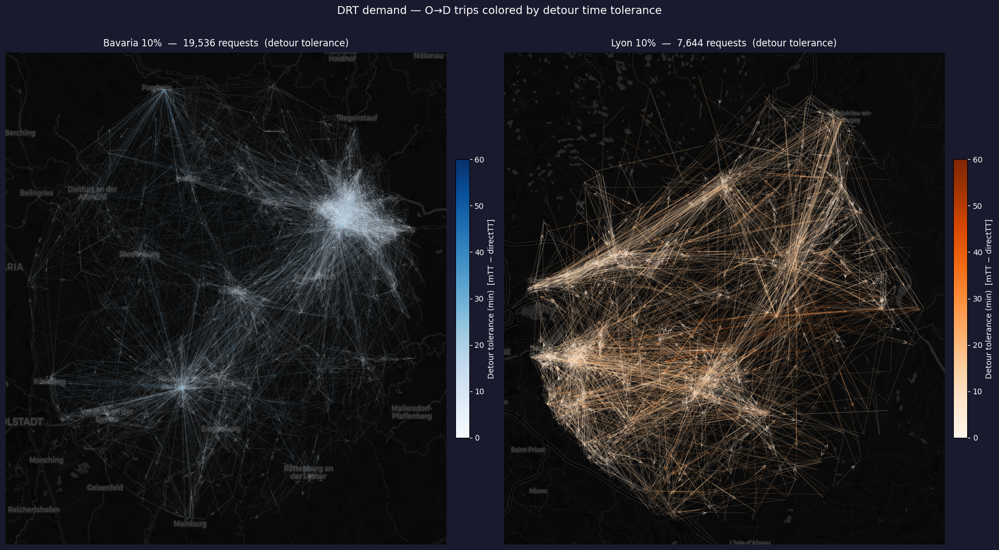

Saved: C:\Users\VWAUCCY\dev\msf\projects\Dissertation\outputs\demand-comparison-10pct\request_map_detour_time.png


In [26]:
fig, axes = plt.subplots(1, 2, figsize=(18, 10))
fig.patch.set_facecolor("#1a1a2e")

for ax, (label, (ds, gdf)) in zip(axes, gdfs.items()):
    det = ((gdf["maxTravelTime"] - gdf["directTravelTime"]) / 60).clip(0, 60).values
    norm  = mcolors.Normalize(vmin=0, vmax=60)
    cmap  = cm.get_cmap(ds["cmap"])
    colors = [cmap(norm(v)) for v in det]
    alpha  = max(0.04, min(0.20, 800 / len(gdf)))

    order = np.argsort(det)
    sorted_gdf    = gdf.iloc[order]
    sorted_colors = [colors[i] for i in order]

    draw_lines(ax, sorted_gdf, sorted_colors, alpha)
    draw_arrows(ax, sorted_gdf, sorted_colors, alpha)
    add_basemap(ax)
    add_colorbar(fig, ax, cmap, norm, "Detour tolerance (min)  [mTT − directTT]")
    ax.set_title(f"{label}  —  {len(gdf):,} requests  (detour tolerance)",
                 color="white", fontsize=12, pad=8)
    ax.set_axis_off()

fig.suptitle("DRT demand — O→D trips colored by detour time tolerance", color="white", fontsize=14, y=0.98)
plt.tight_layout(rect=[0,0,1,0.97])
out = os.path.join(OUT_DIR, "request_map_detour_time.png")
plt.savefig(out, dpi=150, bbox_inches="tight", facecolor="#1a1a2e")
plt.show()
print(f"Saved: {out}")
